In [2]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
plt.style.use('fivethirtyeight')
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode
init_notebook_mode(connected = True)
%matplotlib inline

from pandas_datareader.data import DataReader
import yfinance as yf

from datetime import datetime

In [9]:
tech_list = ['AAPL', 'GOOG', 'MSFT', 'AMZN', 'NFLX']

end = datetime.now()
start = datetime(2000, 1, 1)

for stock in tech_list:
    globals()[stock] = yf.download(stock, start, end)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


In [10]:
company_list = [AAPL, GOOG, MSFT, AMZN, NFLX]
company_name = ['APPLE', 'GOOGLE', 'MICROSOFT', 'AMAZON', 'NETFLIX']

for company, com_name in zip(company_list, company_name):
    company['company_name'] = com_name
    
df = pd.concat(company_list, axis = 0)
df

,Open,High,Low,Close,Adj Close,Volume,company_name
Date,,,,,,,
2000-01-03,0.936384,1.004464,0.907924,0.999442,0.853355,535796800,APPLE
2000-01-04,0.966518,0.987723,0.903460,0.915179,0.781409,512377600,APPLE
2000-01-05,0.926339,0.987165,0.919643,0.928571,0.792844,778321600,APPLE
2000-01-06,0.947545,0.955357,0.848214,0.848214,0.724232,767972800,APPLE
2000-01-07,0.861607,0.901786,0.852679,0.888393,0.758538,460734400,APPLE
...,...,...,...,...,...,...,...
2022-08-22,232.550003,233.479996,224.589996,226.539993,226.539993,8630100,NETFLIX
2022-08-23,226.460007,229.899994,224.300003,224.550003,224.550003,5276900,NETFLIX
2022-08-24,225.660004,234.100006,223.940002,229.610001,229.610001,5426300,NETFLIX


## **Historical view of the closing price**

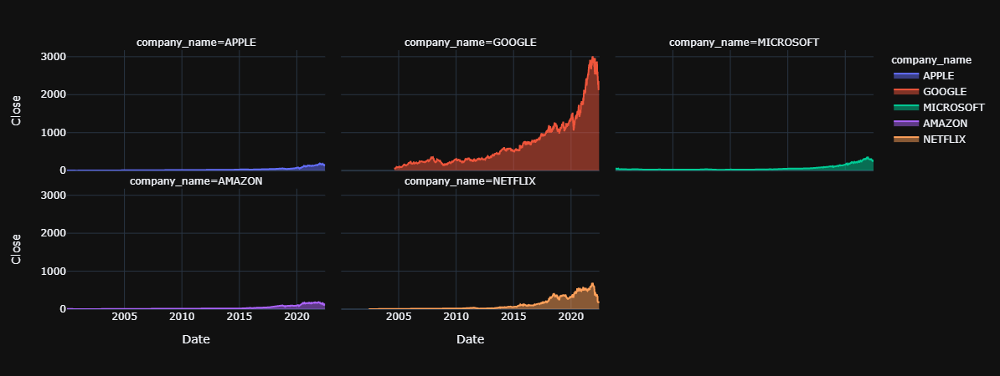

In [54]:
fig = px.area(df, facet_col = 'company_name', x = df.index, y = 'Close', facet_col_wrap = 3, color = 'company_name', template = 'plotly_dark')
fig.show()

## **Sales volume per stock**

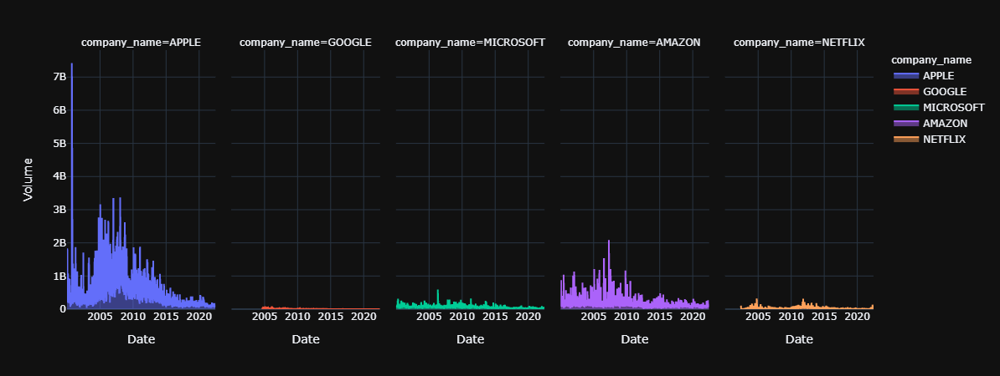

In [55]:
fig = px.area(df, facet_col = 'company_name', x = df.index, y = 'Volume', facet_col_wrap = 5, color = 'company_name', template = 'plotly_dark')
fig.show()

## **Daily return**

In [47]:
df['Daily Return'] = df['Adj Close'].pct_change()

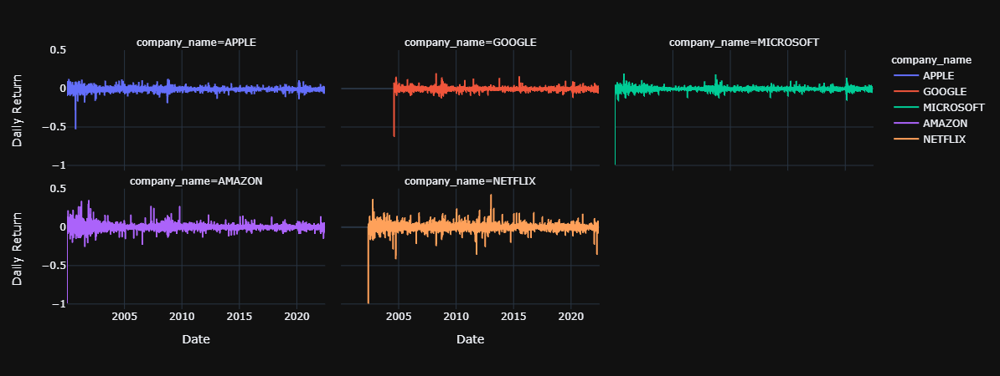

In [61]:
fig = px.line(df, facet_col = 'company_name', x = df.index, y = 'Daily Return', facet_col_wrap = 3, color = 'company_name', template = 'plotly_dark')
fig.show()

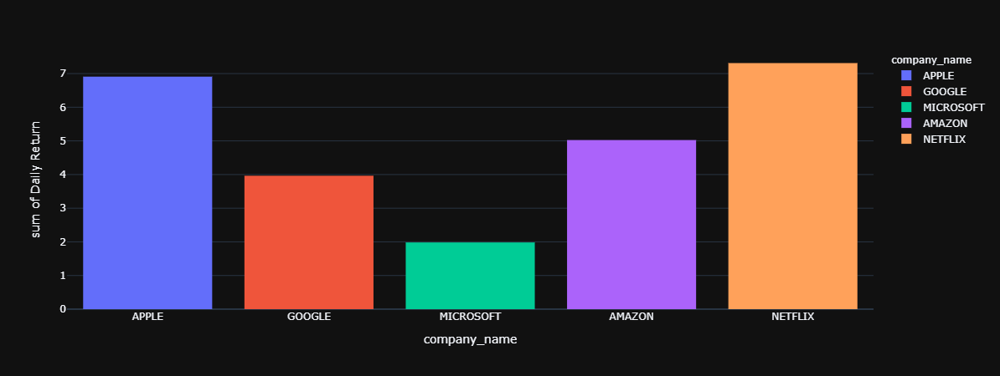

In [64]:
fig = px.histogram(df, x = 'company_name', y = 'Daily Return', color = 'company_name', template = 'plotly_dark')
fig.show()

## **Correlations between stocks**

In [65]:
closing_df = DataReader(tech_list, 'yahoo', start, end)['Adj Close']
closing_df.head()

Symbols,AAPL,GOOG,MSFT,AMZN,NFLX
Date,,,,,
2000-01-03,0.854541,NaN,36.632969,4.468750,NaN
2000-01-04,0.782495,NaN,35.395512,4.096875,NaN
2000-01-05,0.793945,NaN,35.768703,3.487500,NaN
2000-01-06,0.725238,NaN,34.570522,3.278125,NaN
2000-01-07,0.759592,NaN,35.022297,3.478125,NaN


In [67]:
daily = closing_df.pct_change()
daily.head()

Symbols,AAPL,GOOG,MSFT,AMZN,NFLX
Date,,,,,
2000-01-03,NaN,NaN,NaN,NaN,NaN
2000-01-04,-0.084310,NaN,-0.033780,-0.083217,NaN
2000-01-05,0.014633,NaN,0.010543,-0.148741,NaN
2000-01-06,-0.086539,NaN,-0.033498,-0.060036,NaN
2000-01-07,0.047369,NaN,0.013068,0.061010,NaN


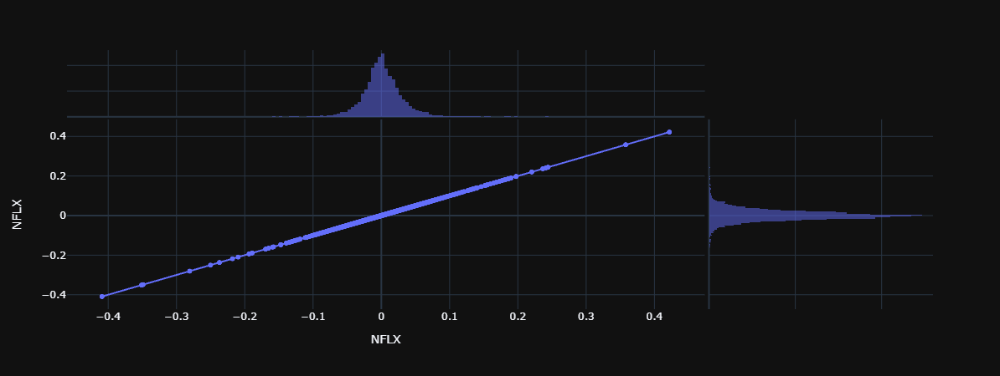

In [72]:
fig = px.scatter(daily, x = 'NFLX', y = 'NFLX', marginal_x = 'histogram', marginal_y = 'histogram', template = 'plotly_dark', trendline = 'ols')
fig.show()

##### **Obviously, there is linearity between Netflix and itself.**

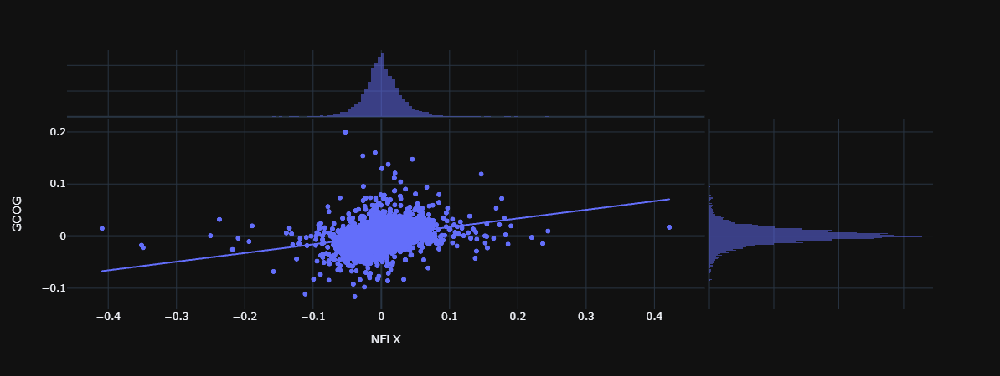

In [71]:
fig = px.scatter(daily, x = 'NFLX', y = 'GOOG', marginal_x = 'histogram', marginal_y = 'histogram', template = 'plotly_dark', trendline = 'ols')
fig.show()

##### **There is a weak and positive correlation between Google and Netflix.**

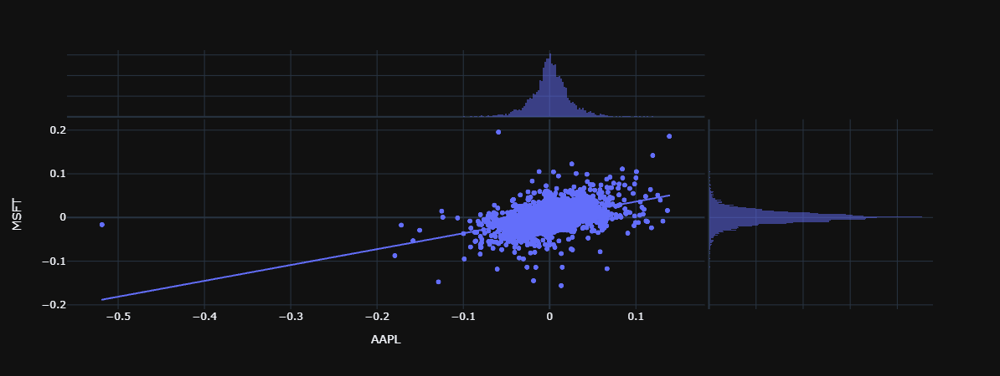

In [73]:
fig = px.scatter(daily, x = 'AAPL', y = 'MSFT', marginal_x = 'histogram', marginal_y = 'histogram', template = 'plotly_dark', trendline = 'ols')
fig.show()

##### **There is a weak positive correlation between Apple and Microsoft**

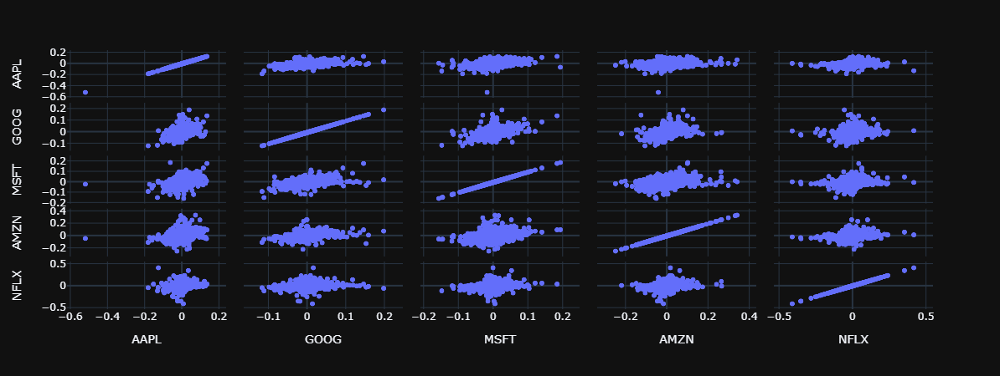

In [82]:
fig = px.scatter_matrix(daily, template = 'plotly_dark')
fig.show()

<AxesSubplot:xlabel='Symbols', ylabel='Symbols'>

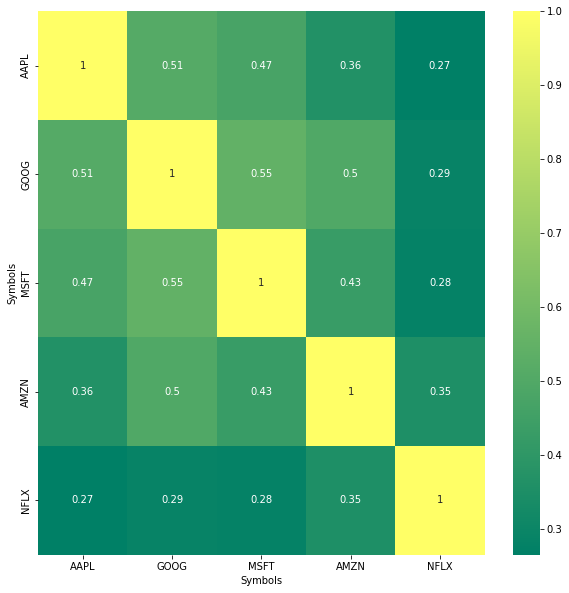

In [86]:
plt.figure(figsize = (10, 10))
sns.heatmap(daily.corr(), annot = True, cmap = 'summer')

##### **The highest correlation to daily returns is between Google and Microsoft, i.e. there is a weak positive correlation of 0.55**

## **Risk and return**

In [88]:
risk = daily.dropna()

In [89]:
area = np.pi * 20

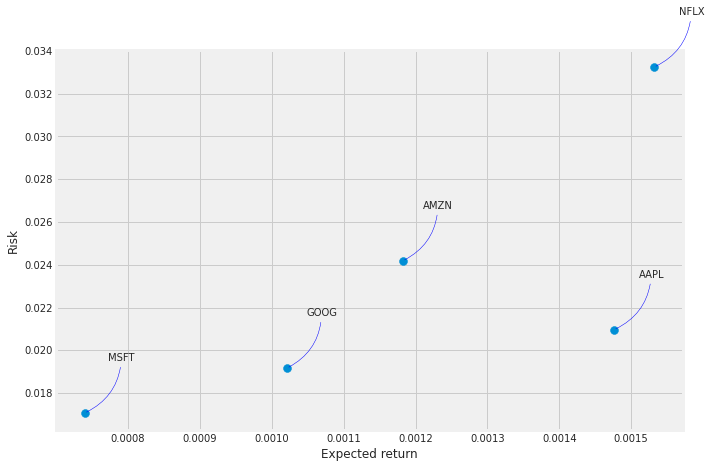

In [96]:
plt.figure(figsize=(10, 7))
plt.scatter(risk.mean(), risk.std(), s=area)
plt.xlabel('Expected return')
plt.ylabel('Risk')

for label, x, y in zip(risk.columns, risk.mean(), risk.std()):
    plt.annotate(label, xy=(x, y), xytext=(50, 50), textcoords='offset points', ha='right', va='bottom', 
                 arrowprops=dict(arrowstyle='-', color='blue', connectionstyle='arc3,rad=-0.3'))

##### **Netflix has a high return but a high risk, while Apple has a high return for a moderate risk, so it would be worth investing in Apple if you have the moderate profile.**

## **Predicting Netflix's closing price**

In [3]:
df2 = DataReader('NFLX', data_source='yahoo', start='2000-01-01', end=datetime.now())
df2

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2002-05-23,1.242857,1.145714,1.156429,1.196429,104790000.0,1.196429
2002-05-24,1.225000,1.197143,1.214286,1.210000,11104800.0,1.210000
2002-05-28,1.232143,1.157143,1.213571,1.157143,6609400.0,1.157143
2002-05-29,1.164286,1.085714,1.164286,1.103571,6757800.0,1.103571
2002-05-30,1.107857,1.071429,1.107857,1.071429,10154200.0,1.071429
...,...,...,...,...,...,...
2022-08-23,229.899994,224.300003,226.460007,224.550003,5276900.0,224.550003
2022-08-24,234.100006,223.940002,225.660004,229.610001,5426300.0,229.610001
2022-08-25,234.160004,229.000000,230.240005,233.979996,3766900.0,233.979996


In [4]:
fig = go.Figure(data=[go.Candlestick(x=df2.index,
                open=df2['Open'],
                high=df2['High'],
                low=df2['Low'],
                close=df2['Close'])])

fig.show()

In [102]:
data = df2.filter(['Close'])
dataset = data.values
training_data_len = int(np.ceil( len(dataset) * .95 ))
training_data_len

4802

In [103]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0,1))
scaled_data = scaler.fit_transform(dataset)

scaled_data

array([[0.00119131],
       [0.00121094],
       [0.00113448],
       ...,
       [0.25999231],
       [0.25021389],
       [0.25333834]])

In [104]:
train_data = scaled_data[0:int(training_data_len), :]

x_train = []
y_train = []

for i in range(60, len(train_data)):
    x_train.append(train_data[i-60:i, 0])
    y_train.append(train_data[i, 0])
    if i<= 61:
        print(x_train)
        print(y_train)
        print()

x_train, y_train = np.array(x_train), np.array(y_train)

x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

[array([0.00119131, 0.00121094, 0.00113448, 0.00105699, 0.00101049,
       0.00101773, 0.00109315, 0.00107765, 0.00112002, 0.00117064,
       0.00107869, 0.00113345, 0.00112931, 0.00104149, 0.00102703,
       0.00088754, 0.00079455, 0.00077802, 0.00083691, 0.00084518,
       0.00087721, 0.00087617, 0.00085551, 0.00089064, 0.00082555,
       0.00090614, 0.00094747, 0.00115721, 0.00121714, 0.00130703,
       0.00116134, 0.00113965, 0.00114378, 0.0012967 , 0.00120784,
       0.00111382, 0.00109005, 0.00103632, 0.00112312, 0.00113861,
       0.00115411, 0.00111898, 0.00107249, 0.00095987, 0.00072119,
       0.00072842, 0.00078318, 0.00084001, 0.00075012, 0.00058584,
       0.00058171, 0.00056104, 0.00060857, 0.0006127 , 0.00059927,
       0.00055588, 0.00057861, 0.00066643, 0.00073772, 0.00078112])]
[0.0008813407630413681]

[array([0.00119131, 0.00121094, 0.00113448, 0.00105699, 0.00101049,
       0.00101773, 0.00109315, 0.00107765, 0.00112002, 0.00117064,
       0.00107869, 0.00113345, 0.

In [105]:
from keras.models import Sequential
from keras.layers import Dense, LSTM

# Build the LSTM model
model = Sequential()
model.add(LSTM(128, return_sequences=True, input_shape= (x_train.shape[1], 1)))
model.add(LSTM(64, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(x_train, y_train, batch_size=1, epochs=1)

2022-06-21 05:12:26.804334: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.
2022-06-21 05:12:27.511072: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


4742/4742 [==============================] - 200s 41ms/step - loss: 6.7957e-04


In [106]:
# Create the testing data set
# Create a new array containing scaled values from index 1543 to 2002 
test_data = scaled_data[training_data_len - 60: , :]
# Create the data sets x_test and y_test
x_test = []
y_test = dataset[training_data_len:, :]
for i in range(60, len(test_data)):
    x_test.append(test_data[i-60:i, 0])
    
# Convert the data to a numpy array
x_test = np.array(x_test)

# Reshape the data
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1 ))

# Get the models predicted price values 
predictions = model.predict(x_test)
predictions = scaler.inverse_transform(predictions)

# Get the root mean squared error (RMSE)
rmse = np.sqrt(np.mean(((predictions - y_test) ** 2)))
rmse

26.24923430876629

In [107]:
train = data[:training_data_len]
valid = data[training_data_len:]
valid['Predictions'] = predictions

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



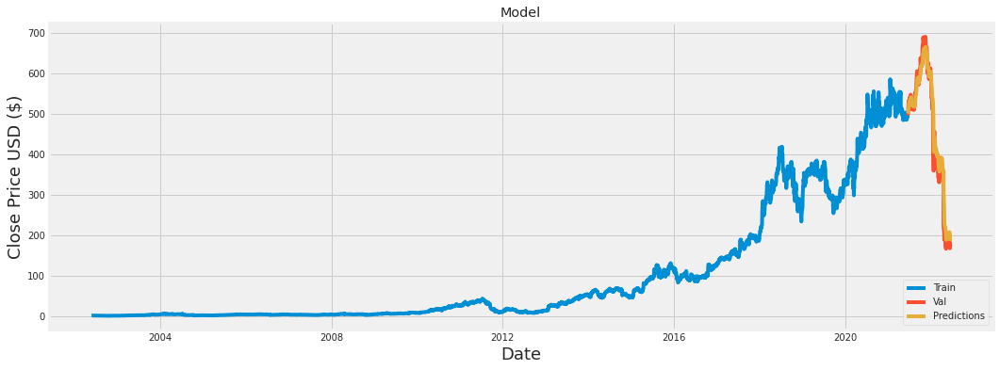

In [116]:
plt.figure(figsize=(16,6))
plt.title('Model')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price USD ($)', fontsize=18)
plt.plot(train['Close'])
plt.plot(valid[['Close', 'Predictions']])
plt.legend(['Train', 'Val', 'Predictions'], loc='lower right')
plt.show()

In [117]:
valid

,Close,Predictions
Date,,
2021-06-21,497.000000,501.224670
2021-06-22,508.820007,501.812561
2021-06-23,512.739990,504.457520
2021-06-24,518.059998,507.923615
2021-06-25,527.070007,511.931122
...,...,...
2022-06-13,169.690002,202.859756
2022-06-14,167.539993,196.124084
2022-06-15,180.110001,189.494751
